In [9]:
import plotly.graph_objects as go
import pandas as pd
curtailment  = pd.read_csv('https://raw.githubusercontent.com/naohiro701/main/main/electricity/3D/TSO_elect_demand.csv')  
REGION_name = ["TSO_Hokkaido","TSO_Tohoku","TSO_Tokyo","TSO_Hokuriku","TSO_Chubu","TSO_Kansai","TSO_Chugoku","TSO_Shikoku","TSO_Kyushu","TSO_Okinawa"]

for reg in REGION_name:
    #print(data)
    data = curtailment[["times", reg]]
    data[reg] = - data[reg]
    data['hours'] = data['times'].astype(str).str.replace(r'.* ',"",regex=True).astype(str).str.replace(r':.*',"",regex=True)
    data['month'] = data['times'].astype(str).str.replace(r' .*',"",regex=True).astype(str).str.replace(r'2019/',"",regex=True).str.zfill(2).str.replace(r'/.*',"",regex=True).str.zfill(2)
    data['day'] = data['times'].astype(str).str.replace(r'.*/',"",regex=True).str.replace(r'.*/',"",regex=True).astype(str).str.replace(r' .*',"",regex=True).str.zfill(2)
    #print(data['day'])
    data['month-day'] = data['month'] + data['day']
    data['hours'] = data['hours'].str.zfill(2)
    xyz = pd.pivot_table(data, index=['hours'], columns='month-day')
    #print(xyz)
    fig.update_layout(
    #width=800, height=800, title = 'Planets!',
scene = dict(
xaxis=dict(title='Hour', titlefont_color='Black', backgroundcolor="#FFFFFF"),
yaxis=dict(title='Day', titlefont_color='Black', backgroundcolor="#FFFFFF"),
zaxis=dict(title='Demand [GW]', titlefont_color='Black', backgroundcolor="#FFFFFF"),
# bgcolor = 'rgb(20, 24, 54)'
))
    fig = go.Figure(data=[go.Surface(z=xyz.values)])
    fig.update_layout(title=reg)
    fig.update_traces(contours_z=dict(show=True, usecolormap=True,highlightcolor="limegreen"))
fig.write_html("elect_demand_%s.html"% reg)

C:\Users\Naoi\AppData\Local\Temp\ipykernel_15364\605359776.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Naoi\AppData\Local\Temp\ipykernel_15364\605359776.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Naoi\AppData\Local\Temp\ipykernel_15364\605359776.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-do

In [8]:
import plotly.graph_objects as go
import numpy as np
import pandas as pd

data  = pd.read_csv('https://raw.githubusercontent.com/naohiro701/main/main/electricity/3D/TSO_elect_demand.csv')  


df_melted = data.reset_index().melt(id_vars=['times'])
df_melted = df_melted[df_melted["variable"]!="index"]

fig = go.Figure(data=[go.Scatter3d(
    x=df_melted ['times'],
    y=df_melted ['variable'],
    z=df_melted ['value']/100,
    mode='markers',
    marker=dict(
        size=1,
        colorscale='balance',   # choose a colorscale
        opacity=0.8,
        color = df_melted['value'],
        # colorscale = 'Viridis',
        colorbar_title = 'Value',
        line_color='rgb(140, 140, 170)'
    )
)])
fig.update_layout(
    #width=800, height=800, title = 'Planets!',
scene = dict(
xaxis=dict(title='Hour', titlefont_color='Black', backgroundcolor="#FFFFFF"),
yaxis=dict(title='Day', titlefont_color='Black', backgroundcolor="#FFFFFF"),
zaxis=dict(title='Demand [GW]', titlefont_color='Black', backgroundcolor="#FFFFFF"),
# bgcolor = 'rgb(20, 24, 54)'
))

# tight layout
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
fig.show()
fig.write_html("tohoku_2year_3D.html")

In [2]:
import seaborn as sns
from matplotlib import pyplot as plt

plt.figure(figsize=(100, 20), dpi=144)

#対数スケールにした
for reg in REGION_name:
    data = curtailment[["times", reg]]
    data[reg] = - data[reg]
    data['hours'] = data['times'].astype(str).str.replace(r'.* ',"",regex=True).astype(str).str.replace(r':.*',"",regex=True)
    data['month'] = data['times'].astype(str).str.replace(r' .*',"",regex=True).astype(str).str.replace(r'2019/',"",regex=True).str.zfill(2).str.replace(r'/.*',"",regex=True).str.zfill(2)
    data['day'] = data['times'].astype(str).str.replace(r'.*/',"",regex=True).str.replace(r'.*/',"",regex=True).astype(str).str.replace(r' .*',"",regex=True).str.zfill(2)
    #print(data['day'])
    data['month-day'] = data['month'] + data['day']
    data['hours'] = data['hours'].str.zfill(2)
    xyz = pd.pivot_table(data, index=['hours'], columns='month-day')


    sns.heatmap(xyz, cmap="Reds")

    plt.savefig("demand_%s.png"% reg)

C:\Users\Naoi\AppData\Local\Temp\ipykernel_28840\491064484.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Naoi\AppData\Local\Temp\ipykernel_28840\491064484.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Naoi\AppData\Local\Temp\ipykernel_28840\491064484.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-do

NameError: name 'LogNorm' is not defined

<Figure size 14400x2880 with 0 Axes>

In [3]:
import plotly.graph_objects as go
import numpy as np
import pandas as pd
curtailment  = pd.read_csv('wo-elefi-elect_demand.csv')
REGION_name = ["TSO_Hokkaido","TSO_Tohoku","TSO_Tokyo","TSO_Hokuriku","TSO_Chubu","TSO_Kansai","TSO_Chugoku","TSO_Shikoku","TSO_Kyushu","TSO_Okinawa"]

for reg in REGION_name:
    data = curtailment[["times", reg]]
    data[reg] = - data[reg]
    data['hours'] = data['times'].astype(str).str.replace(r'.* ',"",regex=True).astype(str).str.replace(r':.*',"",regex=True)
    data['month'] = data['times'].astype(str).str.replace(r' .*',"",regex=True).astype(str).str.replace(r'2019/',"",regex=True).str.zfill(2).str.replace(r'/.*',"",regex=True).str.zfill(2)
    data['day'] = data['times'].astype(str).str.replace(r'.*/',"",regex=True).str.replace(r'.*/',"",regex=True).astype(str).str.replace(r' .*',"",regex=True).str.zfill(2)
    #print(data['day'])
    data['month-day'] = data['month'] + data['day']
    data['hours'] = data['hours'].str.zfill(2)

    fig = go.Figure(data=[go.Scatter3d(
        x=data['hours'],
        y=data['month-day'],
        z=data[reg],
        mode='markers',
        marker=dict(
            size=2,
            color="#ff7675",                # set color to an array/list of desired values
            colorscale='balance',   # choose a colorscale
            opacity=0.8
        )
    )])

    # tight layout
    fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
    fig.show()
    fig.write_html("3D/elect_demand_dust_%s.html"% reg)

# import plotly.express as px
# fig = px.line_3d(data, x="hours", y="month-day", z=reg)

# fig.update_layout(
#     width=800,
#     height=700,
#     autosize=False,
#     scene=dict(
#         camera=dict(
#             up=dict(
#                 x=0,
#                 y=0,
#                 z=1
#             ),
#             eye=dict(
#                 x=0,
#                 y=1.0707,
#                 z=1,
#             )
#         ),
#         aspectratio = dict( x=1, y=1, z=0.7 ),
#         aspectmode = 'manual'
#     ),
# )

# fig.show()


C:\Users\Naoi\AppData\Local\Temp\ipykernel_28840\1747144254.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Naoi\AppData\Local\Temp\ipykernel_28840\1747144254.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Naoi\AppData\Local\Temp\ipykernel_28840\1747144254.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas

C:\Users\Naoi\AppData\Local\Temp\ipykernel_28840\1747144254.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Naoi\AppData\Local\Temp\ipykernel_28840\1747144254.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Naoi\AppData\Local\Temp\ipykernel_28840\1747144254.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas

C:\Users\Naoi\AppData\Local\Temp\ipykernel_28840\1747144254.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Naoi\AppData\Local\Temp\ipykernel_28840\1747144254.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Naoi\AppData\Local\Temp\ipykernel_28840\1747144254.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas

C:\Users\Naoi\AppData\Local\Temp\ipykernel_28840\1747144254.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Naoi\AppData\Local\Temp\ipykernel_28840\1747144254.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Naoi\AppData\Local\Temp\ipykernel_28840\1747144254.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas

C:\Users\Naoi\AppData\Local\Temp\ipykernel_28840\1747144254.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Naoi\AppData\Local\Temp\ipykernel_28840\1747144254.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Naoi\AppData\Local\Temp\ipykernel_28840\1747144254.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas

C:\Users\Naoi\AppData\Local\Temp\ipykernel_28840\1747144254.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Naoi\AppData\Local\Temp\ipykernel_28840\1747144254.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Naoi\AppData\Local\Temp\ipykernel_28840\1747144254.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas

C:\Users\Naoi\AppData\Local\Temp\ipykernel_28840\1747144254.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Naoi\AppData\Local\Temp\ipykernel_28840\1747144254.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Naoi\AppData\Local\Temp\ipykernel_28840\1747144254.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas

C:\Users\Naoi\AppData\Local\Temp\ipykernel_28840\1747144254.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Naoi\AppData\Local\Temp\ipykernel_28840\1747144254.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Naoi\AppData\Local\Temp\ipykernel_28840\1747144254.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas

C:\Users\Naoi\AppData\Local\Temp\ipykernel_28840\1747144254.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Naoi\AppData\Local\Temp\ipykernel_28840\1747144254.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Naoi\AppData\Local\Temp\ipykernel_28840\1747144254.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas

C:\Users\Naoi\AppData\Local\Temp\ipykernel_28840\1747144254.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Naoi\AppData\Local\Temp\ipykernel_28840\1747144254.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Naoi\AppData\Local\Temp\ipykernel_28840\1747144254.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas

C:\Users\Naoi\AppData\Local\Temp\ipykernel_28840\673124526.py:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Naoi\AppData\Local\Temp\ipykernel_28840\673124526.py:14: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Naoi\AppData\Local\Temp\ipykernel_28840\673124526.py:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-d

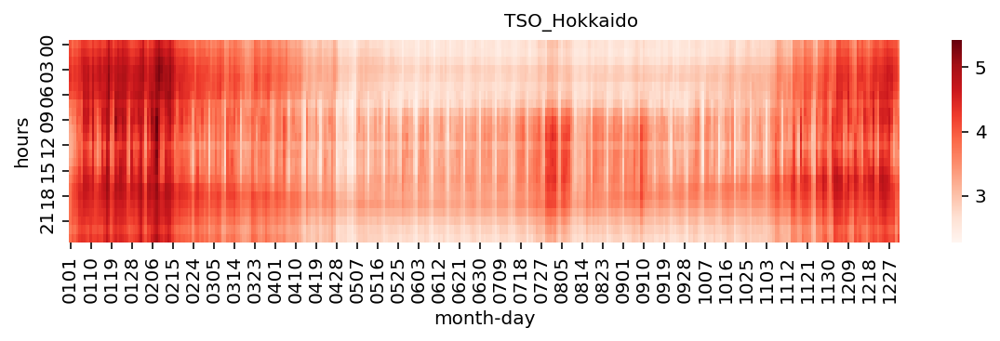

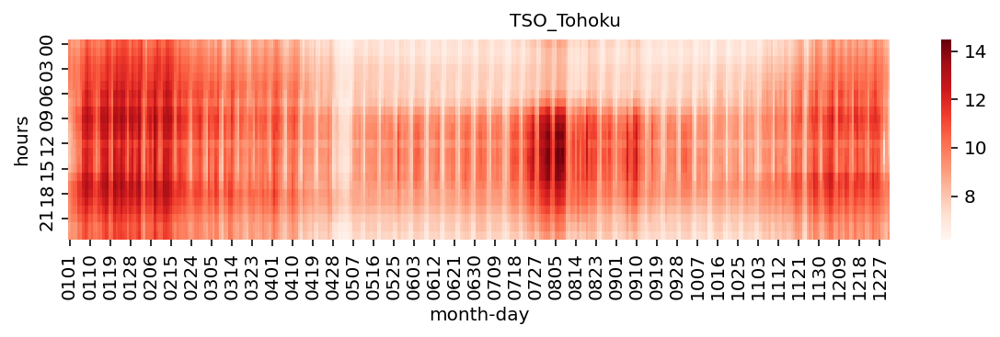

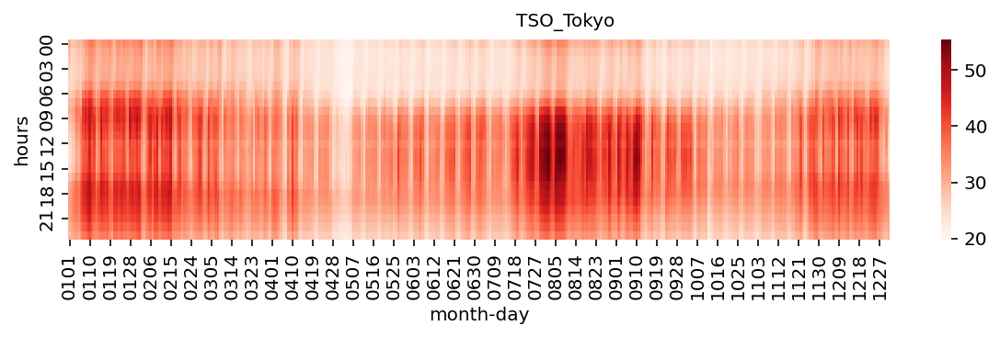

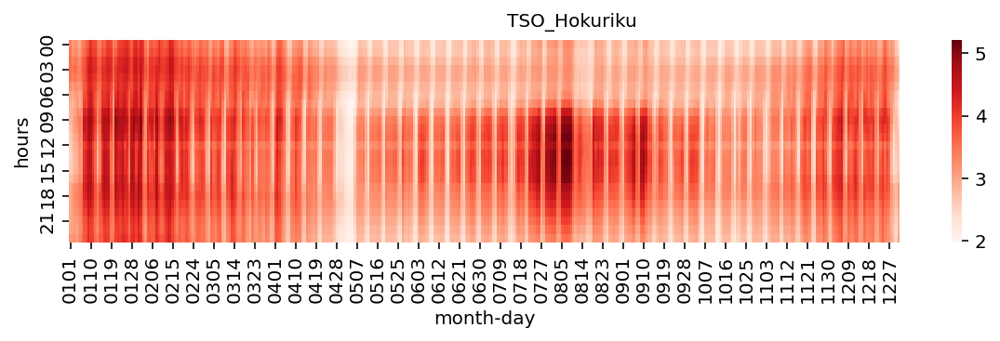

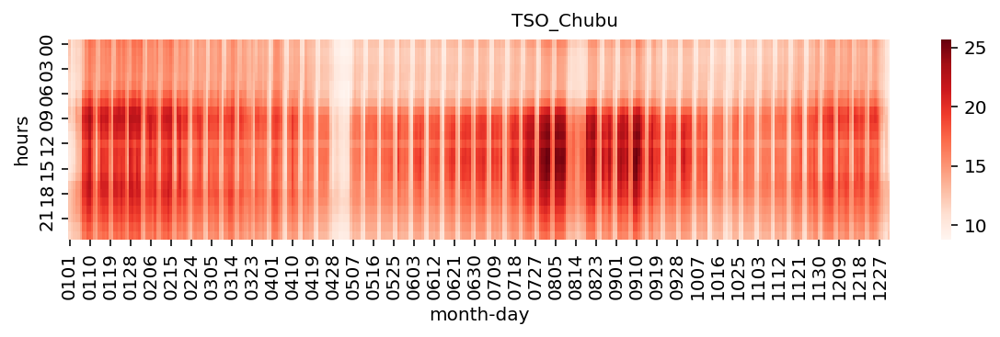

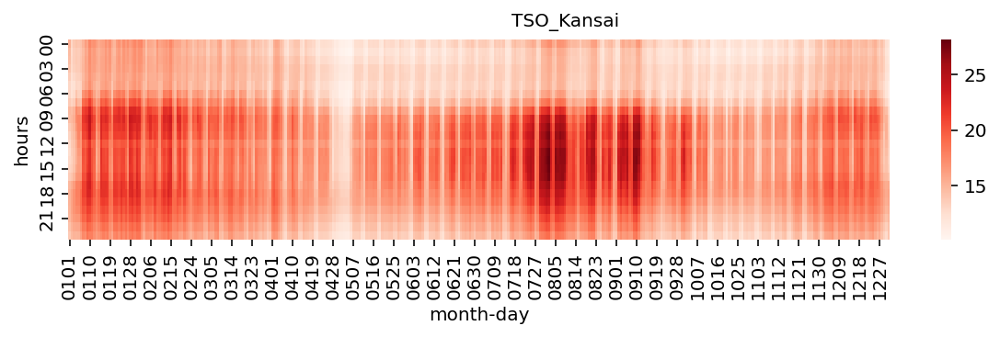

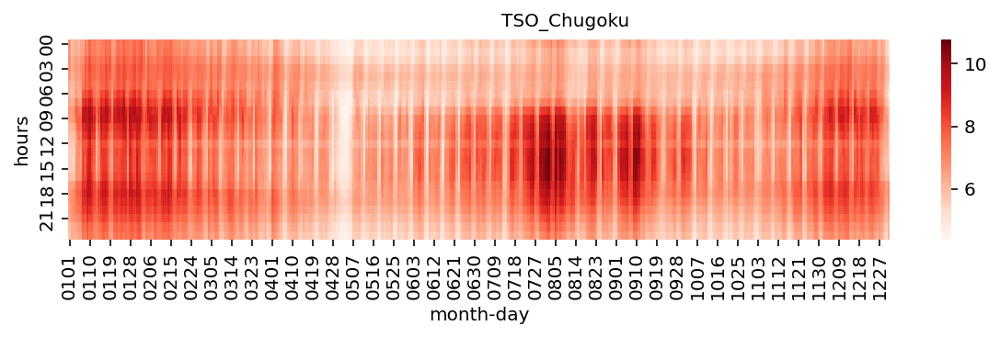

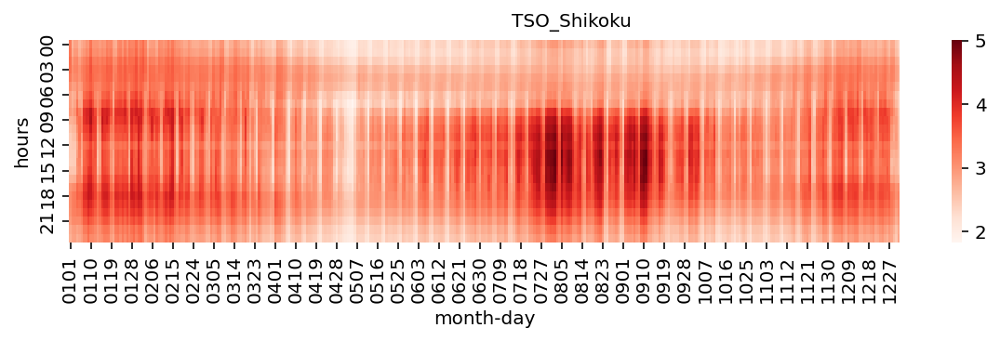

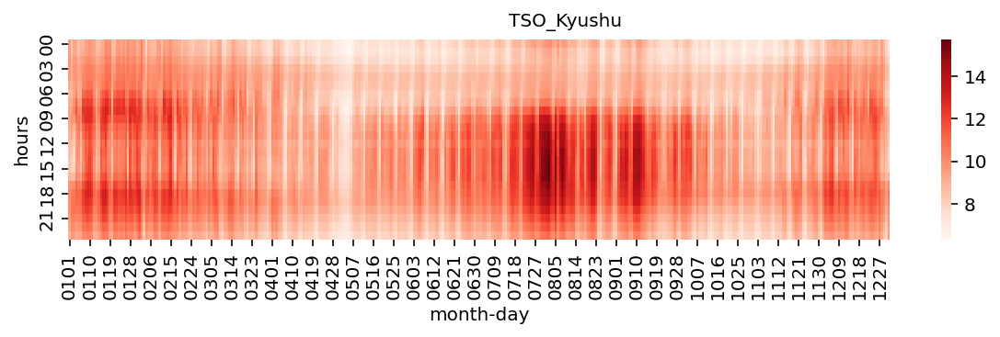

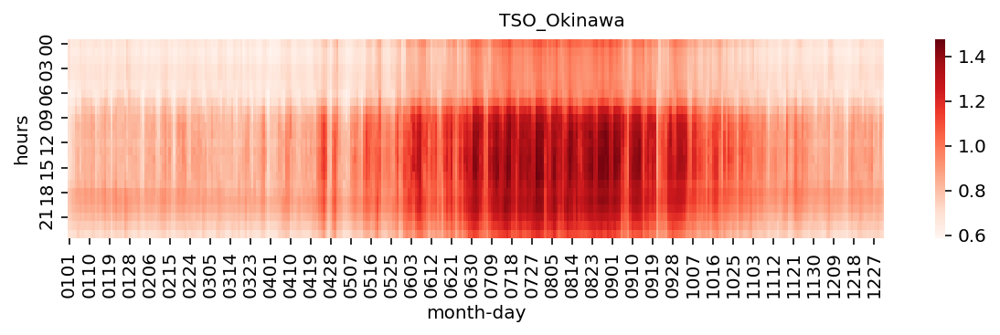

In [33]:
import seaborn as sns
from matplotlib import pyplot as plt


curtailment  = pd.read_csv('wo-elefi-elect_demand.csv')
REGION_name = ["TSO_Hokkaido","TSO_Tohoku","TSO_Tokyo","TSO_Hokuriku","TSO_Chubu","TSO_Kansai","TSO_Chugoku","TSO_Shikoku","TSO_Kyushu","TSO_Okinawa"]
position =1 
#対数スケールにした
for reg in REGION_name:
    fig = plt.figure(figsize=(10, 2), dpi=144)

    data = curtailment[["times", reg]]
    data[reg] = - data[reg]
    data['hours'] = data['times'].astype(str).str.replace(r'.* ',"",regex=True).astype(str).str.replace(r':.*',"",regex=True)
    data['month'] = data['times'].astype(str).str.replace(r' .*',"",regex=True).astype(str).str.replace(r'2019/',"",regex=True).str.zfill(2).str.replace(r'/.*',"",regex=True).str.zfill(2)
    data['day'] = data['times'].astype(str).str.replace(r'.*/',"",regex=True).str.replace(r'.*/',"",regex=True).astype(str).str.replace(r' .*',"",regex=True).str.zfill(2)
    #print(data['day'])
    data['month-day'] = data['month'] + data['day']
    data['hours'] = data['hours'].str.zfill(2)
    xyz = pd.pivot_table(data, index=['hours'], columns='month-day')

    sns.heatmap(xyz[reg], cmap="Reds")

    fig.suptitle(reg, fontsize=10)

    # ax.xaxis.set_ticks([1,32])

    plt.savefig("3D/demand_%s.png"% reg)

In [47]:
import plotly.graph_objects as go
import numpy as np
import pandas as pd
curtailment  = pd.read_csv('https://raw.githubusercontent.com/naohiro701/main/main/electricity/3D/TSO_elect_demand.csv')  
REGION_name = ["TSO_Hokkaido","TSO_Tohoku","TSO_Tokyo","TSO_Hokuriku","TSO_Chubu","TSO_Kansai","TSO_Chugoku","TSO_Shikoku","TSO_Kyushu","TSO_Okinawa"]

for reg in REGION_name:
    data = curtailment[[reg, "day", "hours"]]
    data[reg] = - data[reg]
    fig = go.Figure(data=[go.Scatter3d(
        x=data['hours'],
        y=data['day'],
        z=data[reg],
        mode='markers',
        
        marker = dict(
        sizeref=750,
        size= 3,
        color = data[reg],
        colorscale = 'Viridis',
        colorbar_title = 'Value',
        line_color='rgb(140, 140, 170)'
    )
    )])

    fig.update_layout(
        #width=800, height=800, title = 'Planets!',
    scene = dict(
    xaxis=dict(title='Hour', titlefont_color='Black', backgroundcolor="#FFFFFF"),
    yaxis=dict(title='Day', titlefont_color='Black', backgroundcolor="#FFFFFF"),
    zaxis=dict(title='Value', titlefont_color='Black', backgroundcolor="#FFFFFF"),
    # bgcolor = 'rgb(20, 24, 54)'
    ))

    # tight layout
    fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
    fig.show()
    fig.write_html("3D/elect_demand_dust_%s.html"% reg)



C:\Users\Naoi\AppData\Local\Temp\ipykernel_33192\2143354986.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



C:\Users\Naoi\AppData\Local\Temp\ipykernel_33192\2143354986.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



C:\Users\Naoi\AppData\Local\Temp\ipykernel_33192\2143354986.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



C:\Users\Naoi\AppData\Local\Temp\ipykernel_33192\2143354986.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



C:\Users\Naoi\AppData\Local\Temp\ipykernel_33192\2143354986.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



C:\Users\Naoi\AppData\Local\Temp\ipykernel_33192\2143354986.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



C:\Users\Naoi\AppData\Local\Temp\ipykernel_33192\2143354986.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



C:\Users\Naoi\AppData\Local\Temp\ipykernel_33192\2143354986.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



C:\Users\Naoi\AppData\Local\Temp\ipykernel_33192\2143354986.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



C:\Users\Naoi\AppData\Local\Temp\ipykernel_33192\2143354986.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

